# Homework 5

$\textbf{Please read before running code!}$

Make sure you have the all the python libraries necessary to run the import block below. 

Underneath that cell are the paths to the raw data and reduced data directories. Make sure these correspond to the correct pathing on the device you are running this code.

In [1]:
#import cell
import glob
import numpy as np
from astropy.io import fits
import astropy.units as u
from matplotlib import pyplot as plt
from astropy.visualization import ZScaleInterval
from ccdproc import combine, subtract_overscan, trim_image, subtract_bias
from pathlib import Path
from astropy.nddata import CCDData
from astropy.modeling import models
from astropy.visualization import ZScaleInterval



In [2]:
#initialize path directories 
data_dir = '/home/hernab6/Astr8060_Observational/data/Imaging/'   #raw data directory
reduced_dir = '/home/hernab6/Astr8060_Observational/data/reduced/' 

### Problem 0
Before starting this notebook, the biases, flats, and science images need to be reduced. Run this cell if you do not have these files in yout `reduced_dir` directory. Keep in mind that running this cell will overwrite any files that have already be reduced and have been saved in the `reduced_dir` directory.


This code is from my HW4 notebook. I concluded that the dark current was not significant enough, compared to the noise, to account for in the image reduction process. The following code will be that pipeline where it will pull the raw data from the `data_dir` path and save them to the `reduced_dir` path (both defined in cell above). The reduction process will create a master bias and then overscan subtract, trim, and bias correct all the flats and science images (PG1633+099 and NGC6823).

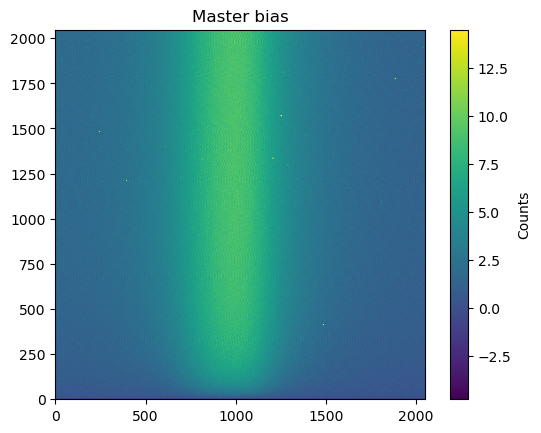

Master bias mean = 3.48801547368632
Master bias std = 3.126191406937161


In [3]:
####################################################################################
############################## Making master bias###################################
####################################################################################
folder = Path(data_dir) 
output_dir = Path(reduced_dir) #path to where the reduced data will be saved (this directory is in my .gitignore)


#obtain bias files
indices = list(range(93, 112)) #indices for bias fies


bias_files = []
for i in indices:
    filename = f"a{i:03d}.fits"
    filepath = folder / filename
    if filepath.exists():
        bias_files.append(filepath)


bias_list_ot=[] #intializing list for overscan subtracted (o) and trimmed (t) biases

for file in bias_files:
    data= fits.getdata(file)
    hdr= fits.getheader(file)
    bias = CCDData(data, unit=u.adu)

    bias_o = subtract_overscan(
        bias,
        overscan=bias[:, 2141:2200],
        overscan_axis=1,
        model=models.Polynomial1D(1)
    )

    bias_ot = trim_image(bias_o[:, 53:2101])

    # new filename in new directory
    new_name = output_dir / (file.stem + "ot.fits")


    # save file
    for k, v in hdr.items(): #pass original header
        if v is not None:
            bias_ot.meta[k] = v
    bias_ot.write(new_name, overwrite=True)

    bias_list_ot.append(bias_ot)


#combine to make master bias
master_bias = combine(
    bias_list_ot,
    method='average'
)
interval=ZScaleInterval()
vmin_master, vmax_master= interval.get_limits(master_bias.data)
plt.imshow(master_bias.data, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
plt.colorbar(label="Counts")
plt.title("Master bias")
plt.show()

print("Master bias mean =", np.mean(master_bias.data))
print("Master bias std =", np.std(master_bias.data))





#####################################################################################################
################################# Correcting the Flat exposures #####################################
#####################################################################################################

sky_flat_files = []
for i in range(5, 63):  # get 5-62
    filename = f"a{i:03d}.fits"
    filepath = folder / filename
    if filepath.exists():
        sky_flat_files.append(filepath)

# overscan subtract, trim, and master bias correct the flats (otz) and save files
for file in sky_flat_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # overscan subtraction
    sky = CCDData(data, unit=u.adu)
    sky_o = subtract_overscan(
        sky,
        overscan=sky[:, 2141:2200],
        overscan_axis=1,
        model=models.Polynomial1D(1)
    )

    # trimming
    sky_ot = trim_image(sky_o[:, 53:2101])

    # bias subtraction
    sky_otz = subtract_bias(ccd=sky_ot, master=master_bias)

    # new filename in new directory
    new_name = output_dir / (file.stem + "otz.fits")


    # save file
    for k, v in hdr.items(): #pass original header
        if v is not None:
            sky_otz.meta[k] = v
    sky_otz.write(new_name, overwrite=True)

################################################################################################
######################## Correcting the Standard Field (PG1633+099) ############################
################################################################################################

#obtain files for P1633
indices = (                 # file numbers that are labelled as 'PG1633' in log.txt
    list(range(64, 93)) +
    list(range(130, 140)) +
    list(range(202, 212)) +
    list(range(221, 247))
)

PG_files = []
for i in indices:
    filename = f"a{i:03d}.fits"
    filepath = folder / filename
    if filepath.exists():
        PG_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for PG1633 (otz) and save files
for file in PG_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # overscan subtraction
    PG = CCDData(data, unit=u.adu)
    PG_o = subtract_overscan(
        PG,
        overscan=PG[:, 2141:2200],
        overscan_axis=1,
        model=models.Polynomial1D(3)
    )

    # trimming
    PG_ot = trim_image(PG_o[:, 53:2101])

    # bias subtraction
    PG_otz = PG_ot.data - master_bias.data #subtract_bias(ccd=PG_ot, master=master_bias)

    # new filename in new directory
    new_name = output_dir / (file.stem + "otz.fits")


    # save file

    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, PG_otz, header=clean_hdr, overwrite=True)

################################################################################################
################################## Correcting the NGC6823 ######################################
################################################################################################

indices = list(range(153, 164))  # file numbers for NHC6823
    

NGC_files = []
for i in indices:
    filename = f"a{i:03d}.fits"
    filepath = folder / filename
    if filepath.exists():
        NGC_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for PG1633 (otz) and save files
for file in NGC_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # overscan subtraction
    NGC = CCDData(data, unit=u.adu)
    NGC_o = subtract_overscan(
        NGC,
        overscan=NGC[:, 2141:2200],
        overscan_axis=1,
        model=models.Polynomial1D(1)
    )

    # trimming
    NGC_ot = trim_image(NGC_o[:, 53:2101])

    # bias subtraction
    NGC_otz = subtract_bias(ccd=NGC_ot, master=master_bias)

    # new filename in new directory
    new_name = output_dir / (file.stem + "otz.fits")

    # save file
    NGC_otz.write(new_name, overwrite=True)


#Ignore the warnings lol

### Problem 1

Examine your individual flat field images for the V filter. Are there significant artifacts?
How might we combine the frames into a master flat field frame to get rid of these
artifacts? Compare the average light levels in your V flats and say how this will impact
your combine strategy (hint: you will want to scale your flat field images to a common
level, and then combine using some weighting to account for the fact that some flats have
higher signal than others–it world be inappropriate to give them all equal weight). After
scaling to a common mean, discuss the advantages and disadvantages of making a master
flat field image from:

- A straight average of all V flat frames
- A straight median of all V flat frames
- An average where outlier pixels are rejected if they are more than 3σfrom the mean
- An average where outlier pixels are rejected and the weighted mean is obtained by
weighting each image by the mean counts in the original image. This way, bright
flats field exposures with higher count rates are given more weight than flats with
low light levels.

Which of these strategies, if any, is the best? Or is some combination the right approach?
Show plots and metrics like RMS to defend your conclusions.

$\textbf{Setup for this problem:}$
I will be using the ovserscan-subtracted, trimmed, bias corrected flats from the previous homework, Homework 4. I have these already saved in my `/reduced` directory.


$\textbf{Logic for this problem:}$
For each flat I will divide the values by their average to normalize each image. When using the `combine()` function from `CCDProc` I include a parameter called 'scale' to scale each image by the inverse mean (which is a function i define), this is the same operation as dividing each exposure by the mean but it is done withing the `combine`

/home/hernab6/Astr8060_Observational/data/reduced/
SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                 2048                                                  
EXTEND  =                    T                                                  
HIERARCH subtract_overscan = 'suboscan' / Shortened name for ccdproc command    
SUBOSCAN= 'ccd=<CCDData>, overscan=<CCDData>, overscan_axis=1, model=Model: &'  
CONTINUE  'Polynomial1DInputs: (''x'',)Outputs: (''y'',)Model set size: &'      
CONTINUE  '1Degree: 1Parameters:     c0  c1    --- ---    0.0 0.0'              
HIERARCH trim_image = 'trimim  ' / Shortened name for ccdproc command           
TRIMIM  = 'ccd=<CCDData>'                                 

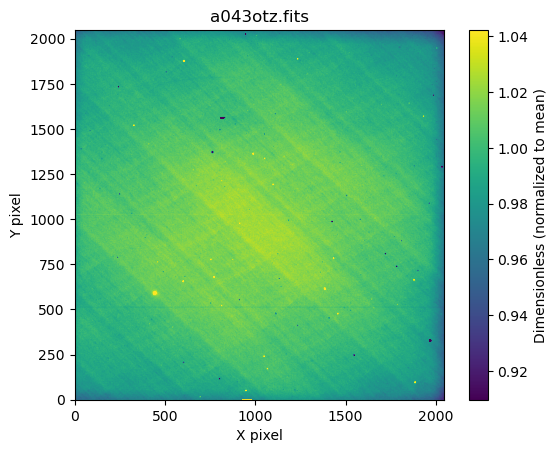

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                 2048                                                  
EXTEND  =                    T                                                  
HIERARCH subtract_overscan = 'suboscan' / Shortened name for ccdproc command    
SUBOSCAN= 'ccd=<CCDData>, overscan=<CCDData>, overscan_axis=1, model=Model: &'  
CONTINUE  'Polynomial1DInputs: (''x'',)Outputs: (''y'',)Model set size: &'      
CONTINUE  '1Degree: 1Parameters:     c0  c1    --- ---    0.0 0.0'              
HIERARCH trim_image = 'trimim  ' / Shortened name for ccdproc command           
TRIMIM  = 'ccd=<CCDData>'                                                       
HIERARCH subtract_bias = 'su

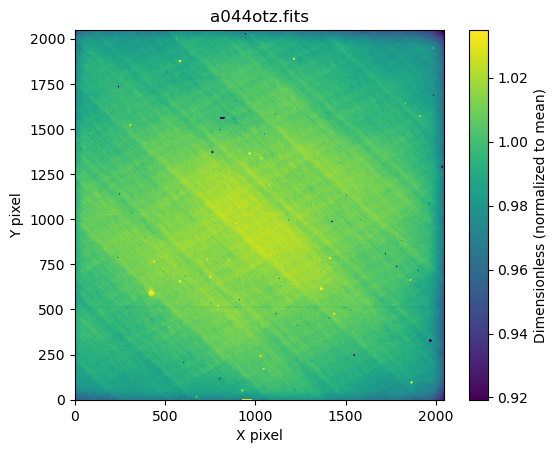

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                 2048                                                  
EXTEND  =                    T                                                  
HIERARCH subtract_overscan = 'suboscan' / Shortened name for ccdproc command    
SUBOSCAN= 'ccd=<CCDData>, overscan=<CCDData>, overscan_axis=1, model=Model: &'  
CONTINUE  'Polynomial1DInputs: (''x'',)Outputs: (''y'',)Model set size: &'      
CONTINUE  '1Degree: 1Parameters:     c0  c1    --- ---    0.0 0.0'              
HIERARCH trim_image = 'trimim  ' / Shortened name for ccdproc command           
TRIMIM  = 'ccd=<CCDData>'                                                       
HIERARCH subtract_bias = 'su

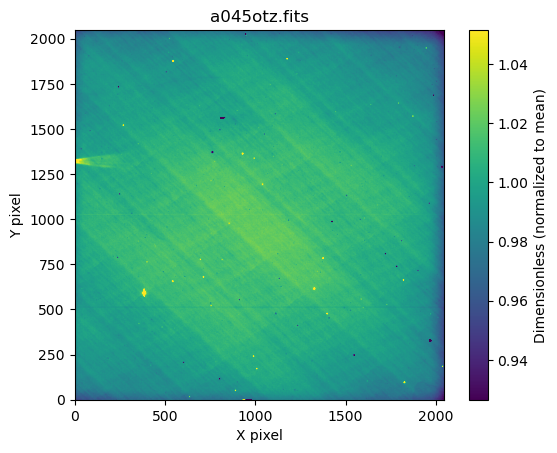

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                 2048                                                  
EXTEND  =                    T                                                  
HIERARCH subtract_overscan = 'suboscan' / Shortened name for ccdproc command    
SUBOSCAN= 'ccd=<CCDData>, overscan=<CCDData>, overscan_axis=1, model=Model: &'  
CONTINUE  'Polynomial1DInputs: (''x'',)Outputs: (''y'',)Model set size: &'      
CONTINUE  '1Degree: 1Parameters:     c0  c1    --- ---    0.0 0.0'              
HIERARCH trim_image = 'trimim  ' / Shortened name for ccdproc command           
TRIMIM  = 'ccd=<CCDData>'                                                       
HIERARCH subtract_bias = 'su

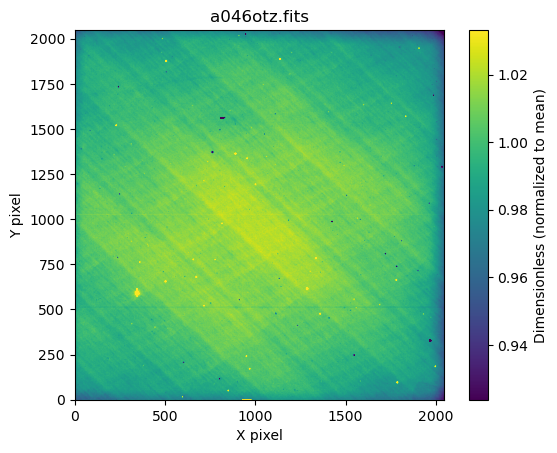

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                 2048                                                  
EXTEND  =                    T                                                  
HIERARCH subtract_overscan = 'suboscan' / Shortened name for ccdproc command    
SUBOSCAN= 'ccd=<CCDData>, overscan=<CCDData>, overscan_axis=1, model=Model: &'  
CONTINUE  'Polynomial1DInputs: (''x'',)Outputs: (''y'',)Model set size: &'      
CONTINUE  '1Degree: 1Parameters:     c0  c1    --- ---    0.0 0.0'              
HIERARCH trim_image = 'trimim  ' / Shortened name for ccdproc command           
TRIMIM  = 'ccd=<CCDData>'                                                       
HIERARCH subtract_bias = 'su

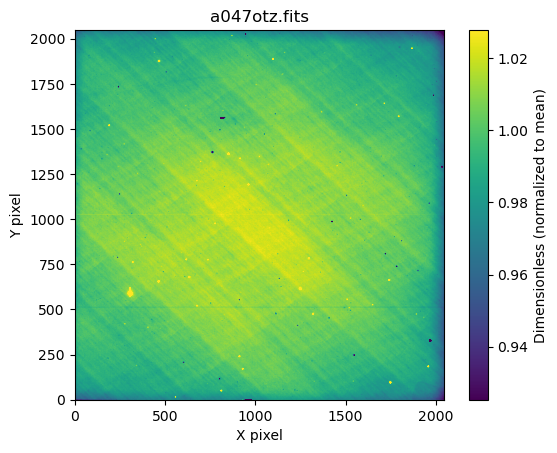

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                 2048                                                  
EXTEND  =                    T                                                  
HIERARCH subtract_overscan = 'suboscan' / Shortened name for ccdproc command    
SUBOSCAN= 'ccd=<CCDData>, overscan=<CCDData>, overscan_axis=1, model=Model: &'  
CONTINUE  'Polynomial1DInputs: (''x'',)Outputs: (''y'',)Model set size: &'      
CONTINUE  '1Degree: 1Parameters:     c0  c1    --- ---    0.0 0.0'              
HIERARCH trim_image = 'trimim  ' / Shortened name for ccdproc command           
TRIMIM  = 'ccd=<CCDData>'                                                       
HIERARCH subtract_bias = 'su

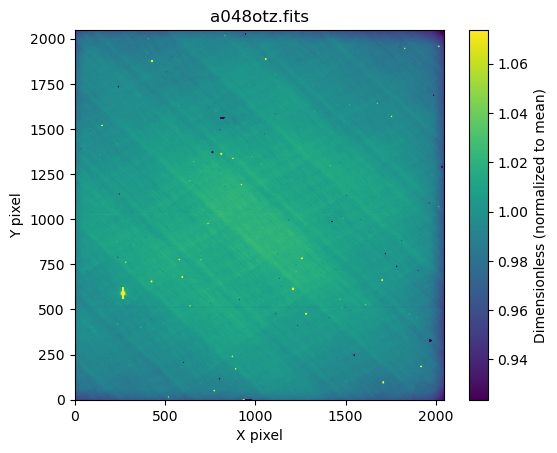

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                 2048                                                  
EXTEND  =                    T                                                  
HIERARCH subtract_overscan = 'suboscan' / Shortened name for ccdproc command    
SUBOSCAN= 'ccd=<CCDData>, overscan=<CCDData>, overscan_axis=1, model=Model: &'  
CONTINUE  'Polynomial1DInputs: (''x'',)Outputs: (''y'',)Model set size: &'      
CONTINUE  '1Degree: 1Parameters:     c0  c1    --- ---    0.0 0.0'              
HIERARCH trim_image = 'trimim  ' / Shortened name for ccdproc command           
TRIMIM  = 'ccd=<CCDData>'                                                       
HIERARCH subtract_bias = 'su

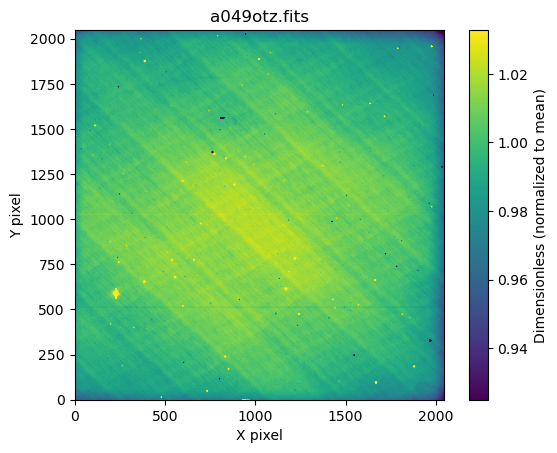

In [4]:
#Examining flat field images for V filter

V_flat_files = glob.glob(reduced_dir+"a04[3-9]otz.fits")   #43-49 are the V filter flats
V_flat_files= sorted(V_flat_files)
print(reduced_dir)
interval=ZScaleInterval()

for i,flat in enumerate(V_flat_files):
    hdu=fits.open(flat)
    hdr=hdu[0].header
    print(repr(hdr))
    data=hdu[0].data
    t_exp= hdr["EXPTIME"]
    # print(exptime)
    flat_norm = data/np.mean(data) #convert to common level 
    
    vmin_master, vmax_master= interval.get_limits(flat_norm)
    plt.imshow(flat_norm, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
    plt.colorbar(label=r"Dimensionless (normalized to mean)")
    plt.title(f"{flat[-12:]}")
    plt.xlabel('X pixel')
    plt.ylabel('Y pixel')
    plt.show()



$\textbf{Are there significant artifacts?}$

Yes there are significant artifacts, all the flats share the same pixels that have the lowest value; these appear as dark patches in the images. Additionally, all the exposures have a diagonal criss-cross pattern (resembles a gingham pattern) across the whole exposure, some more prevalent than others. In the `a045otz.fits` exposure there appears to be a beam coming from the left side, almost like a lighthouse beam.

#### Making Master Flats
$\textbf{1. A straight average of all V flat frames}$

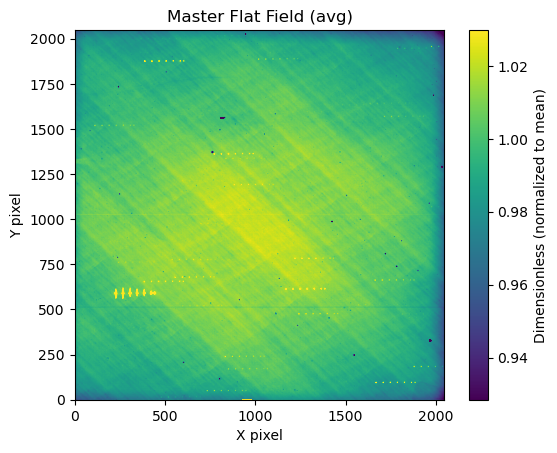

In [5]:
def scale_to_mean(arr):
    return 1.0 / np.mean(arr)

V_flat_master_mean = combine(
    V_flat_files,
    method='average',
    scale=scale_to_mean #scaling to inverse mean will keep the images at the same level
)

vmin_master, vmax_master= interval.get_limits(V_flat_master_mean)
plt.imshow(V_flat_master_mean, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
plt.colorbar(label="Dimensionless (normalized to mean)")
plt.title(f"Master Flat Field (avg)")
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

$\textbf{2. A straight median of all V flat frames}$

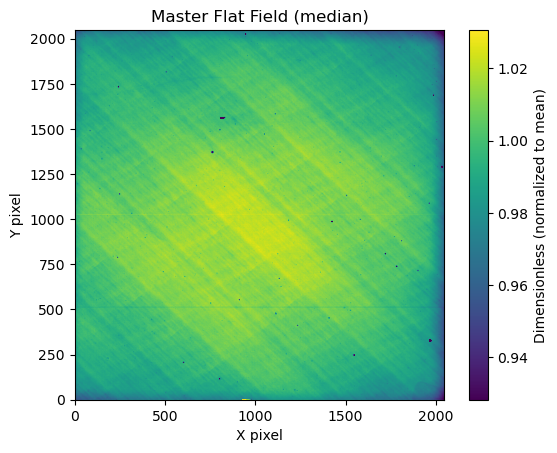

In [6]:
V_flat_master_median = combine(
    V_flat_files,
    method='median',
    scale=scale_to_mean #scaling to inverse mean will keep the images at the same level
)

vmin_master, vmax_master= interval.get_limits(V_flat_master_median)
plt.imshow(V_flat_master_median, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
plt.colorbar(label="Dimensionless (normalized to mean)")
plt.title(f"Master Flat Field (median)")
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

$\textbf{3. Mean with sigma clipping of all V flat frames}$

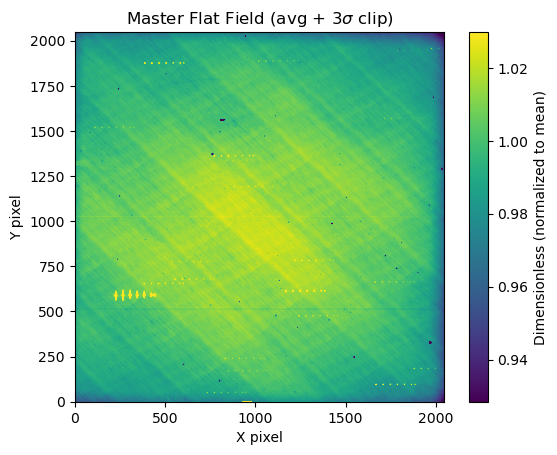

In [7]:
V_flat_master_mean_clipped = combine(
    V_flat_files,
    method='average',
    scale=scale_to_mean, #scaling to inverse mean will keep the images at the same level
    sigma_clip=True,
    sigma_clip_low_thresh=3, #sigma clipping of 3-sigma
    sigma_clip_high_thresh=3
)

vmin_master, vmax_master= interval.get_limits(V_flat_master_mean_clipped)
plt.imshow(V_flat_master_mean_clipped, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
plt.colorbar(label="Dimensionless (normalized to mean)")
plt.title(r"Master Flat Field (avg + 3$\sigma$ clip)")
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

$\textbf{4. Mean with weighted mean}$

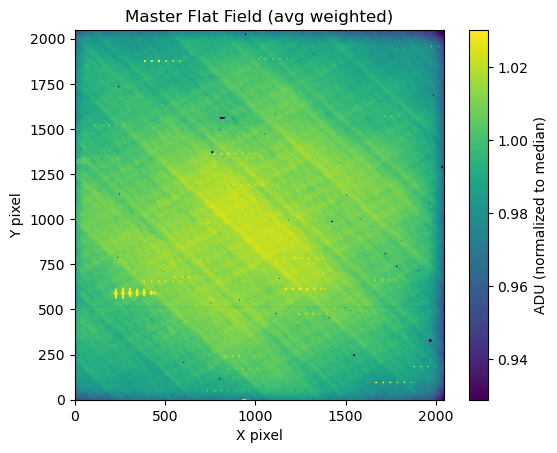

In [8]:
# weights from the original processed flats
weights = np.array([np.mean(fits.getdata(flat)) for flat in V_flat_files])

def scale_to_mean(arr):
    return 1.0 / np.mean(arr)

V_flat_master_mean_weighted  = combine(
    V_flat_files,
    method='average',
    scale=scale_to_mean,
    weights=weights,
)


vmin_master, vmax_master= interval.get_limits(V_flat_master_mean_weighted)
plt.imshow(V_flat_master_mean_weighted, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
plt.colorbar(label="ADU (normalized to median)")
plt.title(r"Master Flat Field (avg weighted)")
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

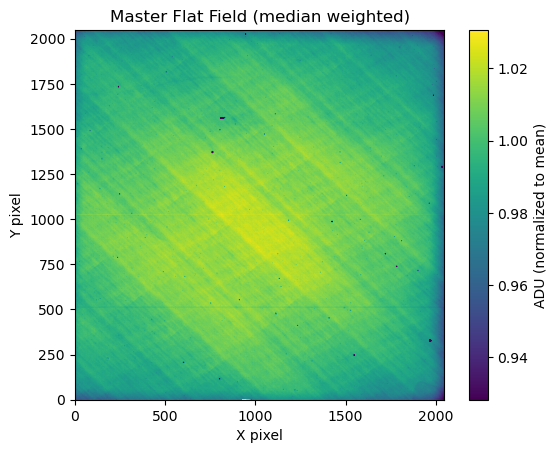

In [9]:
# weights from the original processed flats
weights = np.array([np.median(fits.getdata(flat)) for flat in V_flat_files])

def scale_to_mean(arr):
    return 1.0 / np.mean(arr)

V_flat_master_median_weighted  = combine(
    V_flat_files,
    method='median',
    scale=scale_to_mean,
    weights=weights,
)


vmin_master, vmax_master= interval.get_limits(V_flat_master_median_weighted)
plt.imshow(V_flat_master_median_weighted, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
plt.colorbar(label="ADU (normalized to mean)")
plt.title(r"Master Flat Field (median weighted)")
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

[2.339867   1.87816028 2.339867   1.99854335 1.87816028]


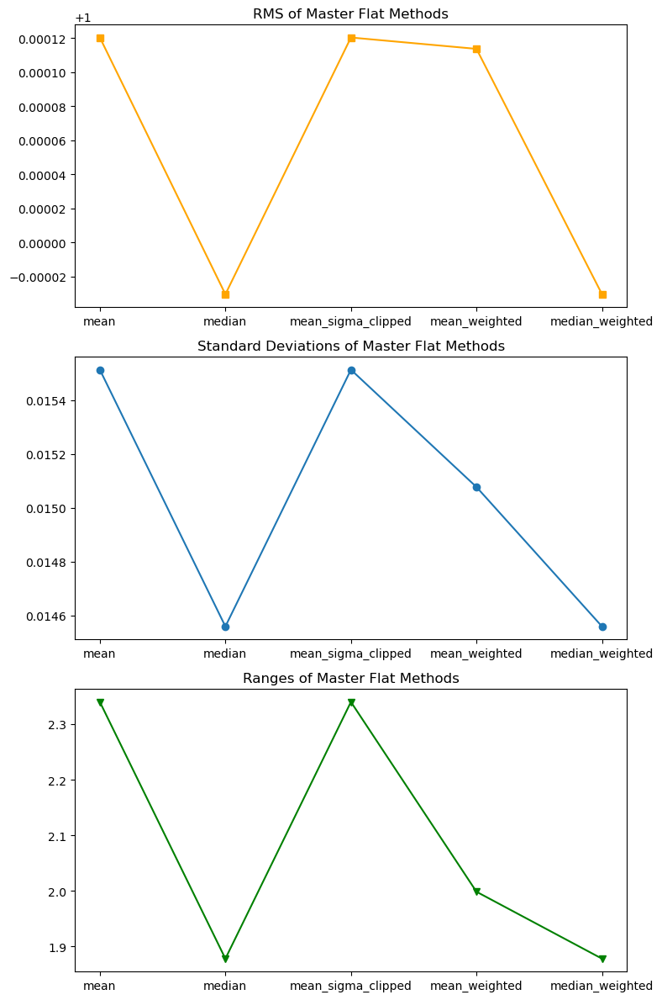

In [10]:
masters= np.array([V_flat_master_mean, V_flat_master_median, V_flat_master_mean_clipped, V_flat_master_mean_weighted, V_flat_master_median_weighted])

#metric calculations
rms_arr= np.sqrt(np.mean(masters**2, axis=(1,2)))
std_arr= np.std(masters, axis=(1,2))
range_arr= np.max(masters, axis=(1,2)) - np.min(masters, axis=(1,2))

print(range_arr)

labels=["mean", "median", "mean_sigma_clipped", "mean_weighted", "median_weighted"]


fig, axes = plt.subplots(3, 1, figsize=(8, 12))



# Individual Plot
im1 = axes[0].plot(labels, rms_arr, '-s', color='orange')
axes[0].set_title("RMS of Master Flat Methods")

# Mean Flat Plot
im2 = axes[1].plot(labels, std_arr, '-o')
axes[1].set_title("Standard Deviations of Master Flat Methods")

im3 = axes[2].plot(labels, range_arr, '-v', color='green') # the smaller the range, the less likely bright artifacts are left
axes[2].set_title("Ranges of Master Flat Methods")

plt.tight_layout()
plt.show()

$\textbf{Which of these strategies, if any, is the best?}$

The flat out median appears better than the other methods with mean (straight mean, sigma clipped mean, and weighted mean). The weighted median has the exact same metric values which indicates there is no difference between the median and weighted median. 

### Problem 2

$\textbf{H-alpha filter}$

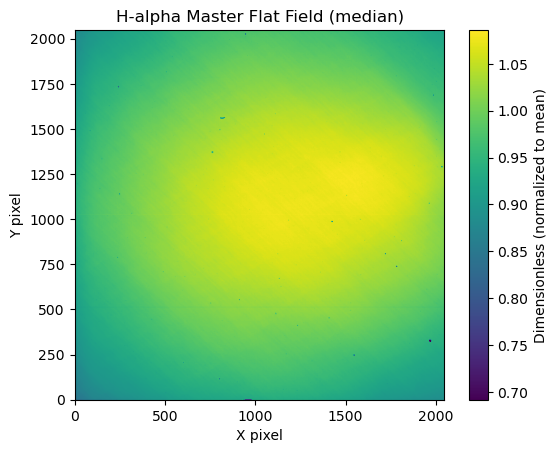

In [11]:
Ha_flat_files = (glob.glob(reduced_dir+"a00[5-9]otz.fits") + #5-20 are the H-alpha filter flats
                glob.glob(reduced_dir+"a01*otz.fits") +
                glob.glob(reduced_dir+"a020otz.fits") 
                )   

Ha_flat_master_median = combine(
    Ha_flat_files,
    method='median',
    scale=scale_to_mean #scaling to inverse mean will keep the images at the same level
)

vmin_master, vmax_master= interval.get_limits(Ha_flat_master_median)
plt.imshow(Ha_flat_master_median, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
plt.colorbar(label="Dimensionless (normalized to mean)")
plt.title(f"H-alpha Master Flat Field (median)")
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

$\textbf{U filter}$

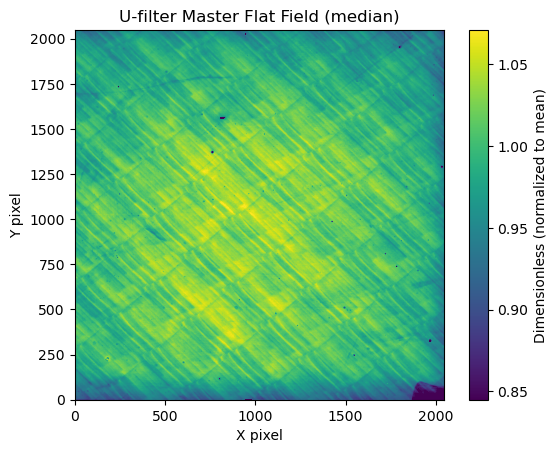

In [12]:
U_flat_files = glob.glob(reduced_dir+"a02[1-8]otz.fits") #21-28 are the U filter flats
   

U_flat_master_median = combine(
    U_flat_files,
    method='median',
    scale=scale_to_mean #scaling to inverse mean will keep the images at the same level
)

vmin_master, vmax_master= interval.get_limits(U_flat_master_median)
plt.imshow(U_flat_master_median, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
plt.colorbar(label="Dimensionless (normalized to mean)")
plt.title(f"U-filter Master Flat Field (median)")
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

$\textbf{B filter}$

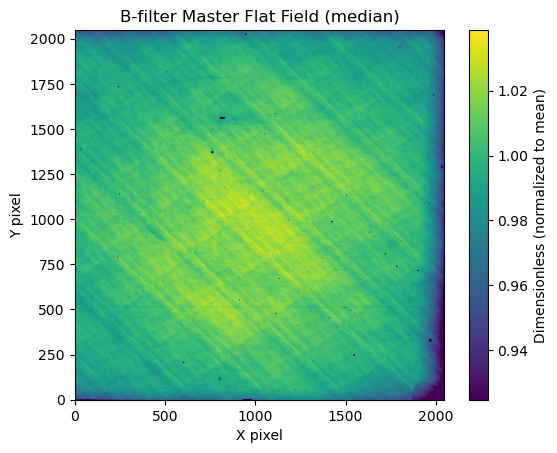

In [13]:
B_flat_files = (glob.glob(reduced_dir+"a029otz.fits") + #5-20 are the H-alpha filter flats
                glob.glob(reduced_dir+"a03[0-9]otz.fits") +
                glob.glob(reduced_dir+"a04[0-2]otz.fits") 
                )   
   

B_flat_master_median = combine(
    B_flat_files,
    method='median',
    scale=scale_to_mean #scaling to inverse mean will keep the images at the same level
)

vmin_master, vmax_master= interval.get_limits(B_flat_master_median)
plt.imshow(B_flat_master_median, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
plt.colorbar(label="Dimensionless (normalized to mean)")
plt.title(f"B-filter Master Flat Field (median)")
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

$\textbf{R filter}$

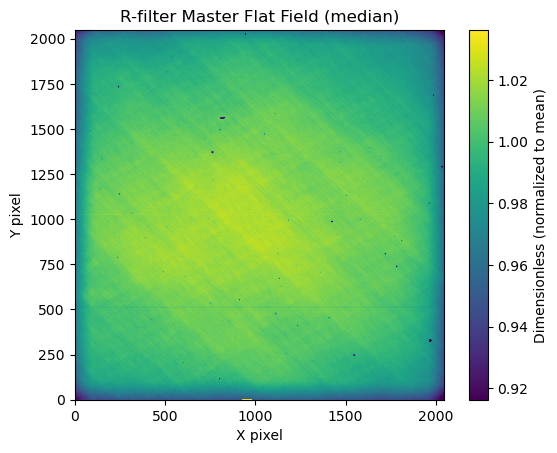

In [14]:
R_flat_files = glob.glob(reduced_dir+"a05[0-5]otz.fits") #50-55 are the R filter flats

   

R_flat_master_median = combine(
    R_flat_files,
    method='median',
    scale=scale_to_mean #scaling to inverse mean will keep the images at the same level
)

vmin_master, vmax_master= interval.get_limits(R_flat_master_median)
plt.imshow(R_flat_master_median, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
plt.colorbar(label="Dimensionless (normalized to mean)")
plt.title(f"R-filter Master Flat Field (median)")
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

$\textbf{I filter}$

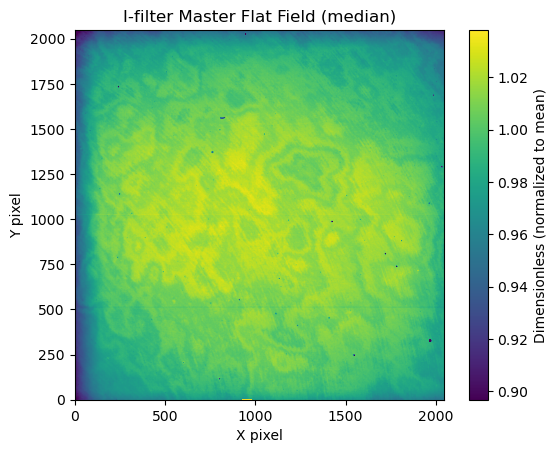

In [15]:
I_flat_files = (glob.glob(reduced_dir+"a05[7-9]otz.fits")+ #57-62 are the H-alpha filter flats
                glob.glob(reduced_dir+"a06[0-2]otz.fits")
                )

I_flat_master_median = combine(
    I_flat_files,
    method='median',
    scale=scale_to_mean #scaling to inverse mean will keep the images at the same level
)

vmin_master, vmax_master= interval.get_limits(I_flat_master_median)
plt.imshow(I_flat_master_median, vmin=vmin_master, vmax=vmax_master, origin='lower', cmap='viridis')
plt.colorbar(label="Dimensionless (normalized to mean)")
plt.title(f"I-filter Master Flat Field (median)")
plt.xlabel('X pixel')
plt.ylabel('Y pixel')
plt.show()

### Problem 3

Normalize your master flat field image for each filter so that it has a mean of 1 (i.e., find
the mean in the image and divide by that mean) This way, when you divide your images
by your master flat field image, you don’t lose track of your photon statistics.

In [16]:
############################# Normalize H-alpha Master #################################
Ha_flat_mean = np.mean(Ha_flat_master_median)
print(Ha_flat_mean)

Ha_flat_master_normalized = Ha_flat_master_median / Ha_flat_mean

############################# Normalize U-band filter Master #################################
U_flat_mean = np.mean(U_flat_master_median)
print(U_flat_mean)

U_flat_master_normalized = U_flat_master_median / U_flat_mean

############################# Normalize V-band filter Master #################################
V_flat_mean = np.mean(V_flat_master_median)
print(V_flat_mean)

V_flat_master_normalized = V_flat_master_median / V_flat_mean

############################# Normalize B-band filter Master #################################
B_flat_mean = np.mean(B_flat_master_median)
print(B_flat_mean)

B_flat_master_normalized = B_flat_master_median / B_flat_mean

############################# Normalize R-band filter Master #################################
R_flat_mean = np.mean(R_flat_master_median)
print(R_flat_mean)

R_flat_master_normalized = R_flat_master_median / R_flat_mean

############################# Normalize I-band filter Master #################################
I_flat_mean = np.mean(I_flat_master_median)
print(I_flat_mean)

I_flat_master_normalized = I_flat_master_median / I_flat_mean

0.9999363554378966
0.9999288341045498
0.999863552994933
0.9997820067447505
0.9994455693956018
0.998689346235173


### Problem 4

Divide all your science frames by your normalized flat field

$\textbf{Flat correcting PG1633+099 (all filters)}$

In [17]:

################################ PG1633+099 Ha flat correction #################################
#obtain files for P1633 in Ha filter
indices = [91,92]                 # Ha exposures of PG1633+099

#initialized file directory
folder = Path(reduced_dir) #pulling from the reduced directory insead of the raw data

PG_files = []
for i in indices:
    filename = f"a{i:03d}otz.fits"
    filepath = folder / filename
    if filepath.exists():
        PG_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for PG1633 (otz) and save files
for file in PG_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # flat correction
    PG_otzf = data/Ha_flat_master_normalized

    # convert masked array to plain ndarray
    PG_otzf = np.ma.filled(PG_otzf, np.nan)
    
    # new filename in new directory
    new_name = output_dir / (file.stem + "f.fits")

    # save file
    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, PG_otzf, header=clean_hdr, overwrite=True)

################################ PG1633+099 U-filter flat correction #################################
#obtain files for P1633 in U filter
indices = [81,82, 130, 131, 202, 203, 221, 222, 237, 238]                 # U-band exposures of PG1633+099

#initialized file directory
folder = Path(reduced_dir) #pulling from the reduced directory insead of the raw data

PG_files = []
for i in indices:
    filename = f"a{i:03d}otz.fits"
    filepath = folder / filename
    if filepath.exists():
        PG_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for PG1633 (otz) and save files
for file in PG_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # flat correction
    PG_otzf = data/U_flat_master_normalized

    # convert masked array to plain ndarray
    PG_otzf = np.ma.filled(PG_otzf, np.nan)
    
    # new filename in new directory
    new_name = output_dir / (file.stem + "f.fits")

    # save file
    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, PG_otzf, header=clean_hdr, overwrite=True)

################################ PG1633+099 B flat correction #################################
#obtain files for P1633 in B filter
indices = [83,84, 132,133, 204,205, 223,224,225,226,239,240]                 # B exposures of PG1633+099

#initialized file directory
folder = Path(reduced_dir) #pulling from the reduced directory insead of the raw data

PG_files = []
for i in indices:
    filename = f"a{i:03d}otz.fits"
    filepath = folder / filename
    if filepath.exists():
        PG_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for PG1633 (otz) and save files
for file in PG_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # flat correction
    PG_otzf = data/B_flat_master_normalized

    # convert masked array to plain ndarray
    PG_otzf = np.ma.filled(PG_otzf, np.nan)
    
    # new filename in new directory
    new_name = output_dir / (file.stem + "f.fits")

    # save file
    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, PG_otzf, header=clean_hdr, overwrite=True)


################################ PG1633+099 V flat correction #################################
#obtain files for P1633 in V filter
indices = [64,65,66,74,75,76,77,78,79,80, 85, 86,134,135,206,207, 227,228,229,230,241,242]                 # V exposures of PG1633+099

#initialized file directory
folder = Path(reduced_dir) #pulling from the reduced directory insead of the raw data

PG_files = []
for i in indices:
    filename = f"a{i:03d}otz.fits"
    filepath = folder / filename
    if filepath.exists():
        PG_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for PG1633 (otz) and save files
for file in PG_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # flat correction
    PG_otzf = data/V_flat_master_normalized

    # convert masked array to plain ndarray
    PG_otzf = np.ma.filled(PG_otzf, np.nan)
    
    # new filename in new directory
    new_name = output_dir / (file.stem + "f.fits")

    # save file
    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, PG_otzf, header=clean_hdr, overwrite=True)


################################ PG1633+099 R flat correction #################################
#obtain files for P1633 in R filter
indices = [87,88,136,137,208,209,231,232,235,236,243,244]                 # R exposures of PG1633+099

#initialized file directory
folder = Path(reduced_dir) #pulling from the reduced directory insead of the raw data

PG_files = []
for i in indices:
    filename = f"a{i:03d}otz.fits"
    filepath = folder / filename
    if filepath.exists():
        PG_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for PG1633 (otz) and save files
for file in PG_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # flat correction
    PG_otzf = data/R_flat_master_normalized

    # convert masked array to plain ndarray
    PG_otzf = np.ma.filled(PG_otzf, np.nan)
    
    # new filename in new directory
    new_name = output_dir / (file.stem + "f.fits")

    # save file
    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, PG_otzf, header=clean_hdr, overwrite=True)

################################ PG1633+099 I flat correction #################################
#obtain files for P1633 in I filter
indices = [89,90,138,139,210,211,233,234,245,246]                 # I exposures of PG1633+099

#initialized file directory
folder = Path(reduced_dir) #pulling from the reduced directory insead of the raw data

PG_files = []
for i in indices:
    filename = f"a{i:03d}otz.fits"
    filepath = folder / filename
    if filepath.exists():
        PG_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for PG1633 (otz) and save files
for file in PG_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # flat correction
    PG_otzf = data/I_flat_master_normalized
    
    # convert masked array to plain ndarray
    PG_otzf = np.ma.filled(PG_otzf, np.nan)

    # new filename in new directory
    new_name = output_dir / (file.stem + "f.fits")

    # save file
    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, PG_otzf, header=clean_hdr, overwrite=True)


$\textbf{Flat correcting NGC6823 (all filters)}$

In [19]:
################################ NGC U-filter flat correction #################################
#obtain files for NGC in U filter
indices = [162,163]                 # U-band exposures of NGC6823

#initialized file directory
folder = Path(reduced_dir) #pulling from the reduced directory insead of the raw data

NGC_files = []
for i in indices:
    filename = f"a{i:03d}otz.fits"
    filepath = folder / filename
    if filepath.exists():
        NGC_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for NGC6823 (otz) and save files
for file in NGC_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # flat correction
    NGC_otzf = data/U_flat_master_normalized

    # convert masked array to plain ndarray
    NGC_otzf = np.ma.filled(NGC_otzf, np.nan)
    
    # new filename in new directory
    new_name = output_dir / (file.stem + "f.fits")

    # save file
    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, NGC_otzf, header=clean_hdr, overwrite=True)

################################ NGC6823 B flat correction #################################
#obtain files for P1633 in B filter
indices = [160,161]                 # B exposures of NGC6823

#initialized file directory
folder = Path(reduced_dir) #pulling from the reduced directory insead of the raw data

NGC_files = []
for i in indices:
    filename = f"a{i:03d}otz.fits"
    filepath = folder / filename
    if filepath.exists():
        NGC_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for NGC6823 (otz) and save files
for file in NGC_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # flat correction
    NGC_otzf = data/B_flat_master_normalized

    # convert masked array to plain ndarray
    NGC_otzf = np.ma.filled(NGC_otzf, np.nan)
    
    # new filename in new directory
    new_name = output_dir / (file.stem + "f.fits")

    # save file
    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, NGC_otzf, header=clean_hdr, overwrite=True)


################################ NGC6823 V flat correction #################################
#obtain files for P1633 in V filter
indices = [157,158,159]                 # V exposures of NGC6823

#initialized file directory
folder = Path(reduced_dir) #pulling from the reduced directory insead of the raw data

NGC_files = []
for i in indices:
    filename = f"a{i:03d}otz.fits"
    filepath = folder / filename
    if filepath.exists():
        NGC_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for NGC6823 (otz) and save files
for file in NGC_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # flat correction
    NGC_otzf = data/V_flat_master_normalized

    # convert masked array to plain ndarray
    NGC_otzf = np.ma.filled(NGC_otzf, np.nan)
    
    # new filename in new directory
    new_name = output_dir / (file.stem + "f.fits")

    # save file
    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, NGC_otzf, header=clean_hdr, overwrite=True)


################################ NGC6823 R flat correction #################################
#obtain files for P1633 in R filter
indices = [155,156]                 # R exposures of NGC6823

#initialized file directory
folder = Path(reduced_dir) #pulling from the reduced directory insead of the raw data

NGC_files = []
for i in indices:
    filename = f"a{i:03d}otz.fits"
    filepath = folder / filename
    if filepath.exists():
        NGC_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for NGC6823 (otz) and save files
for file in NGC_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # flat correction
    NGC_otzf = data/R_flat_master_normalized

    # convert masked array to plain ndarray
    NGC_otzf = np.ma.filled(NGC_otzf, np.nan)
    
    # new filename in new directory
    new_name = output_dir / (file.stem + "f.fits")

    # save file
    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, NGC_otzf, header=clean_hdr, overwrite=True)

################################ NGC6823 I flat correction #################################
#obtain files for P1633 in I filter
indices = [153,154]                 # I exposures of NGC6823

#initialized file directory
folder = Path(reduced_dir) #pulling from the reduced directory insead of the raw data

NGC_files = []
for i in indices:
    filename = f"a{i:03d}otz.fits"
    filepath = folder / filename
    if filepath.exists():
        NGC_files.append(filepath)

# overscan subtract, trim, and master bias correct the science exposures for NGC6823 (otz) and save files
for file in NGC_files:
    data = fits.getdata(file)
    hdr = fits.getheader(file)

    # flat correction
    NGC_otzf = data/I_flat_master_normalized
    
    # convert masked array to plain ndarray
    NGC_otzf = np.ma.filled(NGC_otzf, np.nan)

    # new filename in new directory
    new_name = output_dir / (file.stem + "f.fits")

    # save file
    clean_hdr = hdr.copy()
    for k, v in list(clean_hdr.items()):
        if v is None:
            del clean_hdr[k]

    fits.writeto(new_name, NGC_otzf, header=clean_hdr, overwrite=True)


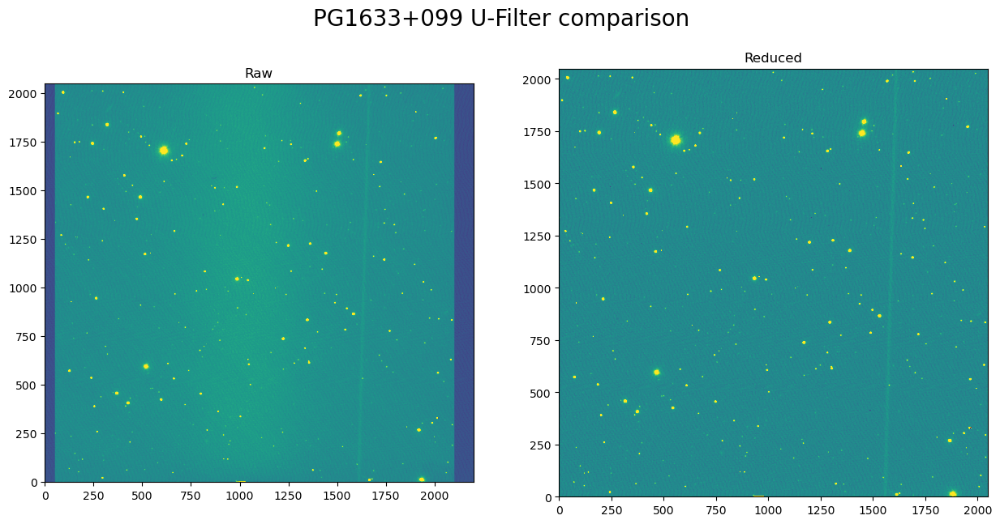

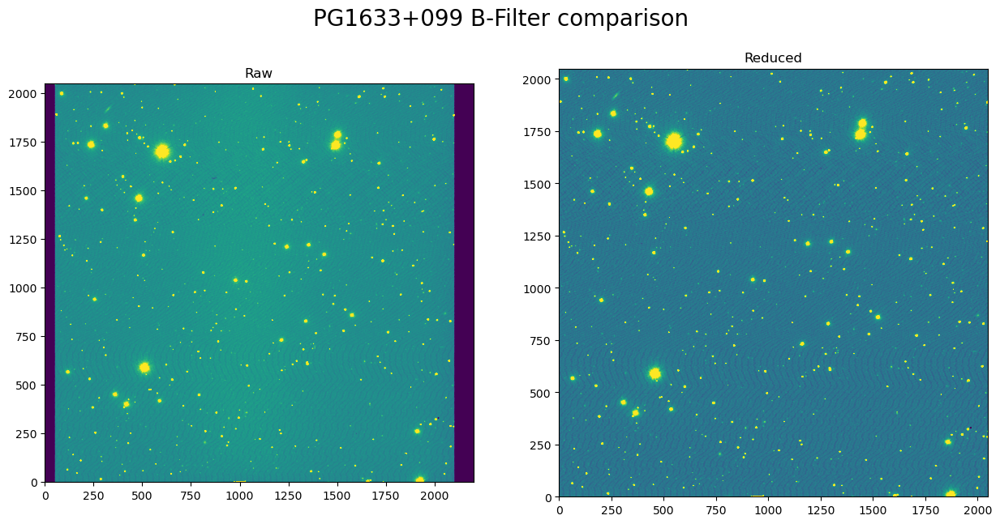

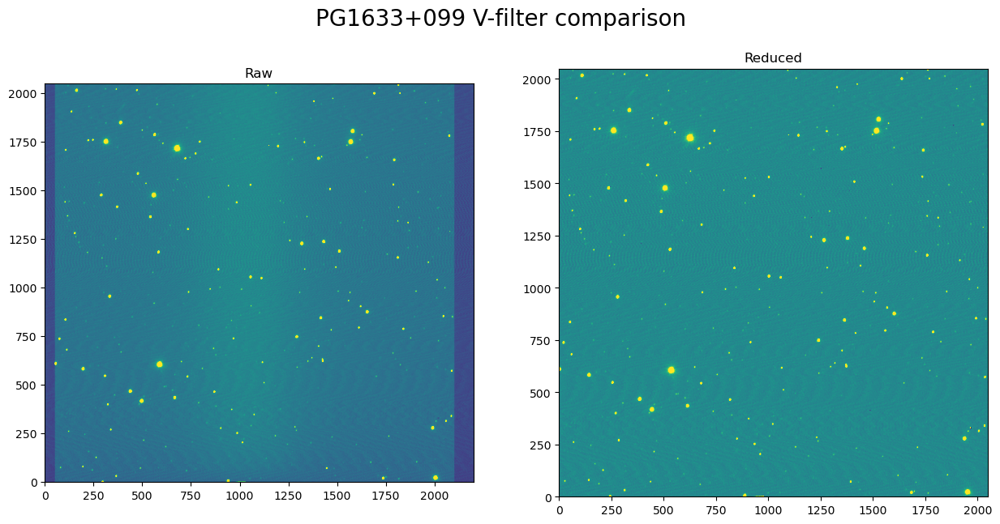

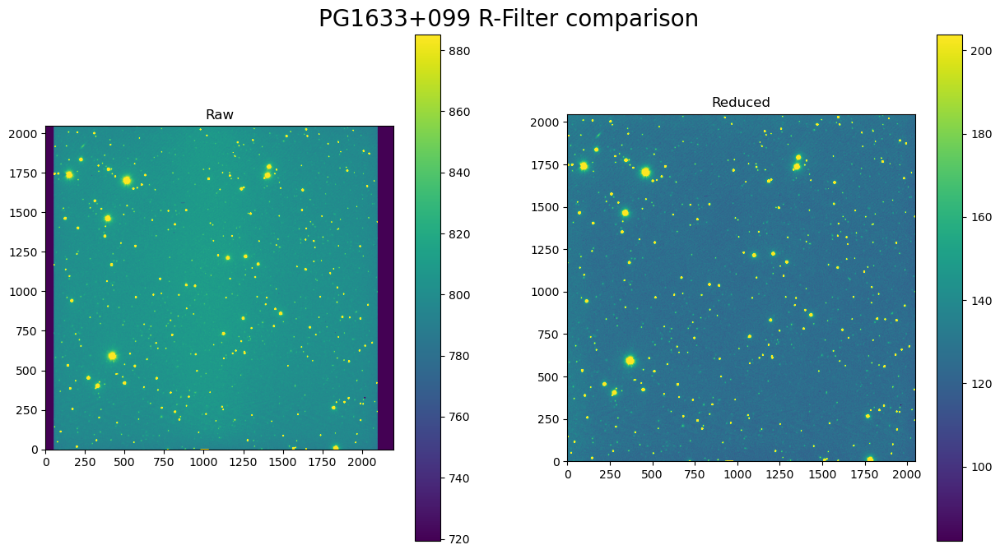

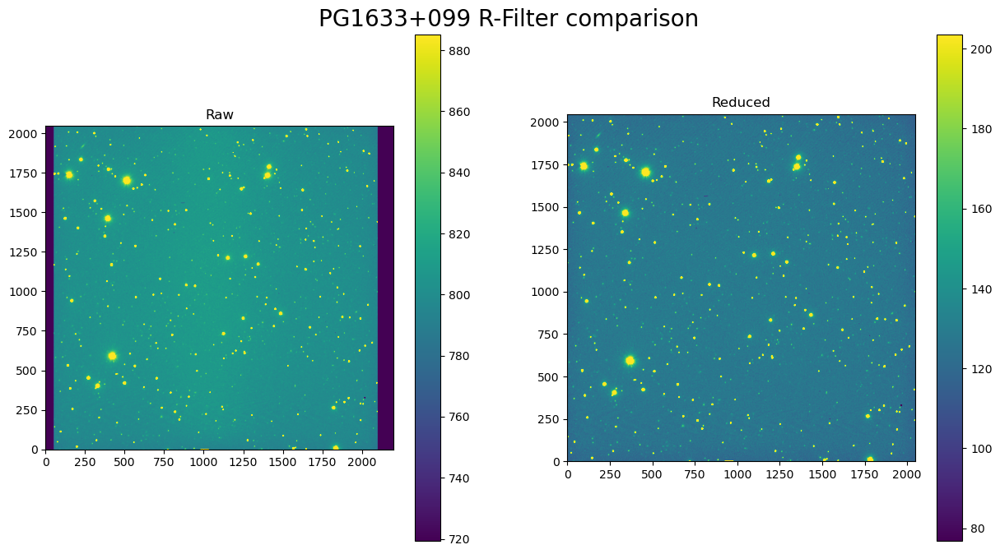

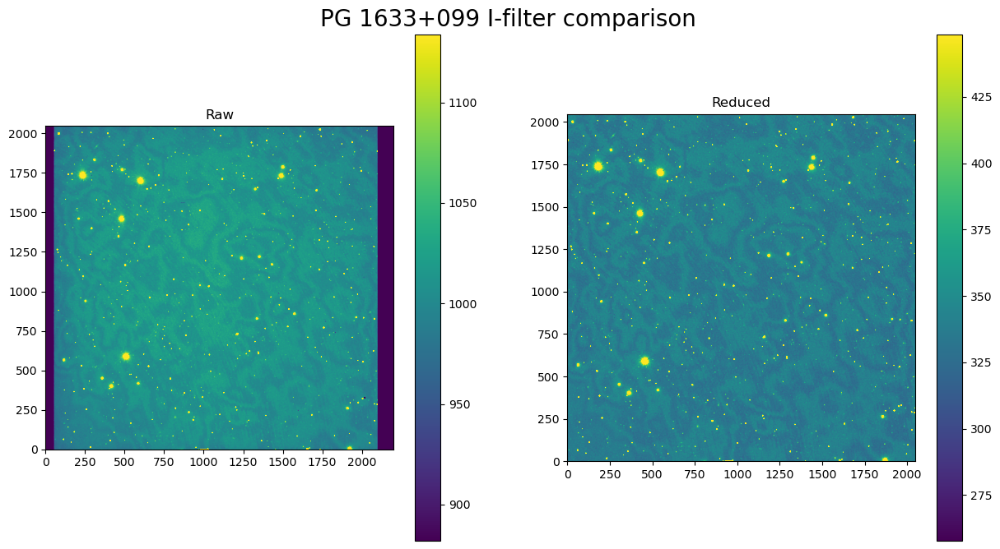

In [25]:
################ Let's look at the science images in different filters! ###########

################################## U filter #########################
PG_U_raw= glob.glob(data_dir+"a130.fits")
PG_U_reduced= glob.glob(reduced_dir+"a130otzf.fits")
PG_U_raw_data= fits.getdata(PG_U_raw[0])

PG_U_reduced_data= fits.getdata(PG_U_reduced[0])



fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_U_raw, vmax_U_raw= interval.get_limits(PG_U_raw_data)
im1 = axes[0].imshow(PG_U_raw_data, vmin=vmin_U_raw, vmax=vmax_U_raw, origin='lower', cmap='viridis')
axes[0].set_title("Raw")
#plt.colorbar(im1, ax=axes[1])

vmin_U_reduced, vmax_U_reduced= interval.get_limits(PG_U_reduced_data)
im0 = axes[1].imshow(PG_U_reduced_data, vmin=vmin_U_reduced, vmax=vmax_U_reduced, origin='lower', cmap='viridis')
axes[1].set_title("Reduced")
#plt.colorbar(im0, ax=axes[0])


fig.suptitle(f"PG1633+099 U-Filter comparison", fontsize=20, y=0.92)
plt.show()


################################## B filter #########################
PG_B_raw= glob.glob(data_dir+"a204.fits")
PG_B_reduced= glob.glob(reduced_dir+"a204otzf.fits")
PG_B_raw_data= fits.getdata(PG_B_raw[0])

PG_B_reduced_data= fits.getdata(PG_B_reduced[0])



fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_B_raw, vmax_B_raw= interval.get_limits(PG_B_raw_data)
im1 = axes[0].imshow(PG_B_raw_data, vmin=vmin_B_raw, vmax=vmax_B_raw, origin='lower', cmap='viridis')
axes[0].set_title("Raw")
#plt.colorbar(im1, ax=axes[1])

vmin_B_reduced, vmax_B_reduced= interval.get_limits(PG_B_reduced_data)
im0 = axes[1].imshow(PG_B_reduced_data, vmin=vmin_B_reduced, vmax=vmax_B_reduced, origin='lower', cmap='viridis')
axes[1].set_title("Reduced")
#plt.colorbar(im0, ax=axes[0])


fig.suptitle(f"PG1633+099 B-Filter comparison", fontsize=20, y=0.92)
plt.show()

################################## V filter #########################
PG_V_raw= glob.glob(data_dir+"a066.fits")
PG_V_reduced= glob.glob(reduced_dir+"a066otzf.fits")
PG_V_raw_data= fits.getdata(PG_V_raw[0])

PG_V_reduced_data= fits.getdata(PG_V_reduced[0])



fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_V_raw, vmax_V_raw= interval.get_limits(PG_V_raw_data)
im1 = axes[0].imshow(PG_V_raw_data, vmin=vmin_V_raw, vmax=vmax_V_raw, origin='lower', cmap='viridis')
axes[0].set_title("Raw")
#plt.colorbar(im1, ax=axes[1])

vmin_V_reduced, vmax_V_reduced= interval.get_limits(PG_V_reduced_data)
im0 = axes[1].imshow(PG_V_reduced_data, vmin=vmin_V_reduced, vmax=vmax_V_reduced, origin='lower', cmap='viridis')
axes[1].set_title("Reduced")
#plt.colorbar(im0, ax=axes[0])


fig.suptitle(f"PG1633+099 V-filter comparison", fontsize=20, y=0.92)
plt.show()

################################## R filter #########################
#[87,88,136,137,208,209,231,232,235,236,243,244] 
PG_R_raw= glob.glob(data_dir+"a243.fits")
PG_R_reduced= glob.glob(reduced_dir+"a243otzf.fits")
PG_R_raw_data= fits.getdata(PG_R_raw[0])

PG_R_reduced_data= fits.getdata(PG_R_reduced[0])



fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_R_raw, vmax_R_raw= interval.get_limits(PG_R_raw_data)
im1 = axes[0].imshow(PG_R_raw_data, vmin=vmin_R_raw, vmax=vmax_R_raw, origin='lower', cmap='viridis')
axes[0].set_title("Raw")
plt.colorbar(im1, ax=axes[0])

vmin_R_reduced, vmax_R_reduced= interval.get_limits(PG_R_reduced_data)
im0 = axes[1].imshow(PG_R_reduced_data, vmin=vmin_R_reduced, vmax=vmax_R_reduced, origin='lower', cmap='viridis')
axes[1].set_title("Reduced")
plt.colorbar(im0, ax=axes[1])


fig.suptitle(f"PG1633+099 R-Filter comparison", fontsize=20, y=0.92)
plt.show()


PG_R_raw= glob.glob(data_dir+"a243.fits")
PG_R_reduced= glob.glob(reduced_dir+"a243otz.fits")
PG_R_raw_data= fits.getdata(PG_R_raw[0])

PG_R_reduced_data= fits.getdata(PG_R_reduced[0])



fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_R_raw, vmax_R_raw= interval.get_limits(PG_R_raw_data)
im1 = axes[0].imshow(PG_R_raw_data, vmin=vmin_R_raw, vmax=vmax_R_raw, origin='lower', cmap='viridis')
axes[0].set_title("Raw")
plt.colorbar(im1, ax=axes[0])

vmin_R_reduced, vmax_R_reduced= interval.get_limits(PG_R_reduced_data)
im0 = axes[1].imshow(PG_R_reduced_data, vmin=vmin_R_reduced, vmax=vmax_R_reduced, origin='lower', cmap='viridis')
axes[1].set_title("Reduced")
plt.colorbar(im0, ax=axes[1])


fig.suptitle(f"PG1633+099 R-Filter comparison", fontsize=20, y=0.92)
plt.show()


################################## I filter #########################
PG_I_raw= glob.glob(data_dir+"a210.fits")
PG_I_reduced= glob.glob(reduced_dir+"a210otzf.fits")
PG_I_raw_data= fits.getdata(PG_I_raw[0])

PG_I_reduced_data= fits.getdata(PG_I_reduced[0])



fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_I_raw, vmax_I_raw= interval.get_limits(PG_I_raw_data)
im1 = axes[0].imshow(PG_I_raw_data, vmin=vmin_I_raw, vmax=vmax_I_raw, origin='lower', cmap='viridis')
axes[0].set_title("Raw")
plt.colorbar(im1, ax=axes[0])

vmin_I_reduced, vmax_I_reduced= interval.get_limits(PG_I_reduced_data)
im0 = axes[1].imshow(PG_I_reduced_data, vmin=vmin_I_reduced, vmax=vmax_I_reduced, origin='lower', cmap='viridis')
axes[1].set_title("Reduced")
plt.colorbar(im0, ax=axes[1])


fig.suptitle(f"PG 1633+099 I-filter comparison", fontsize=20, y=0.92)
plt.show()



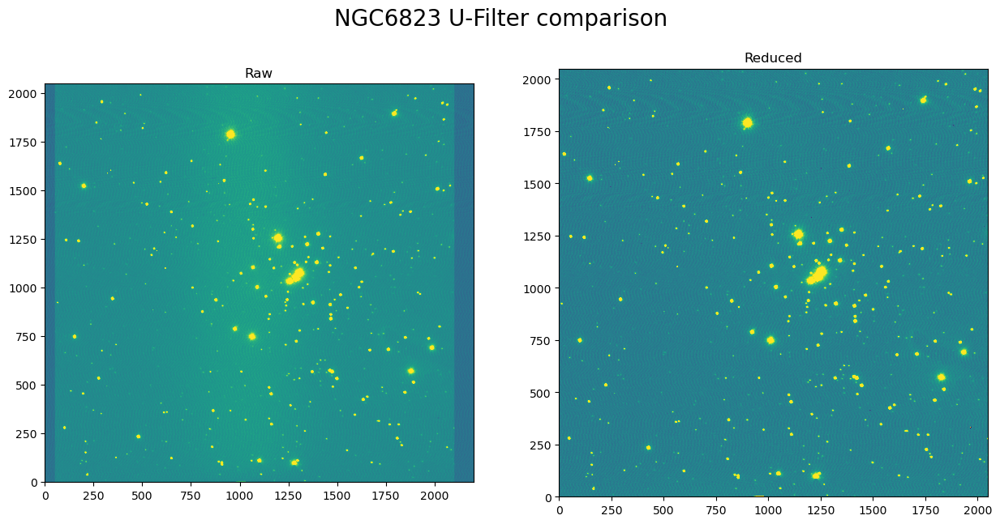

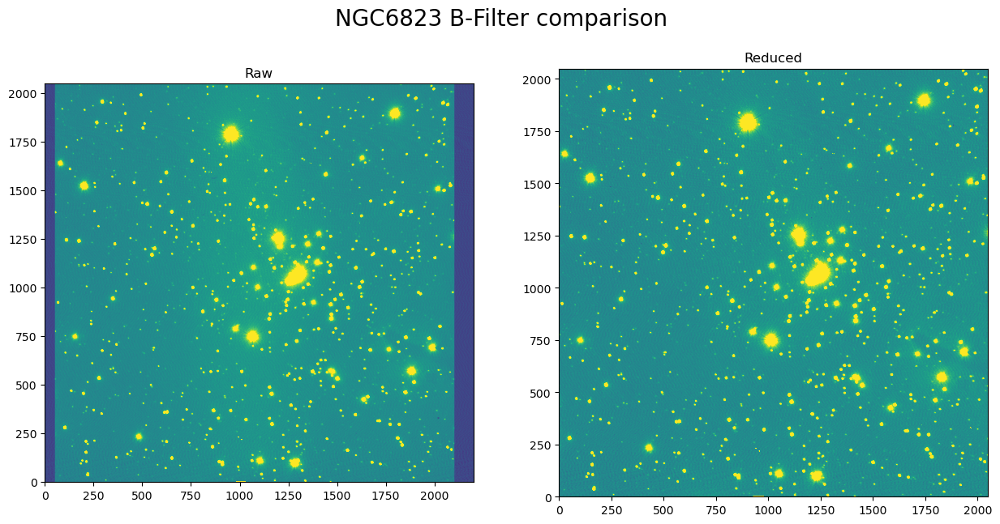

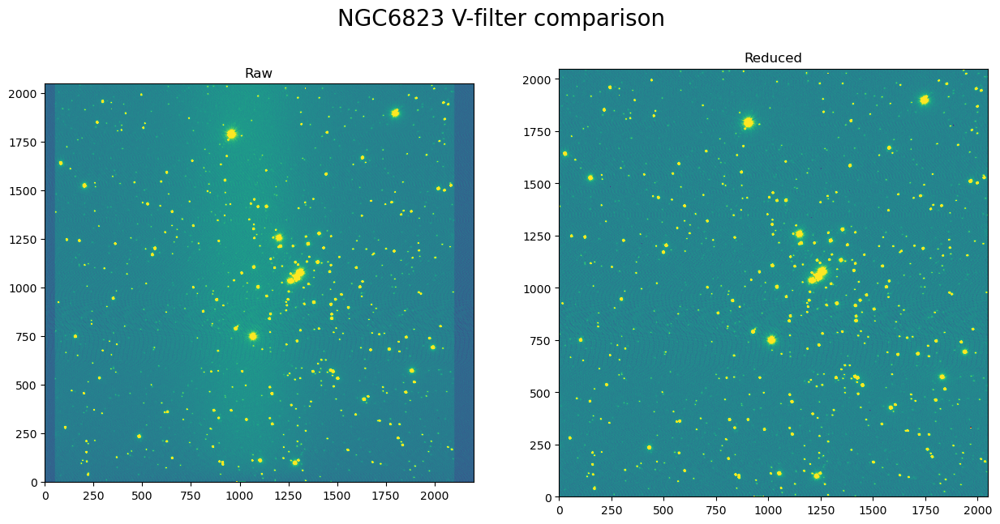

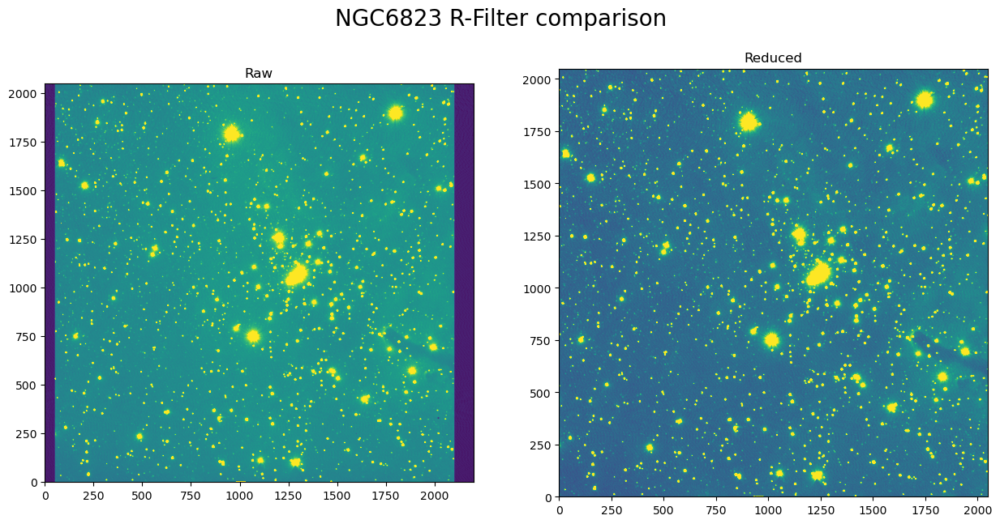

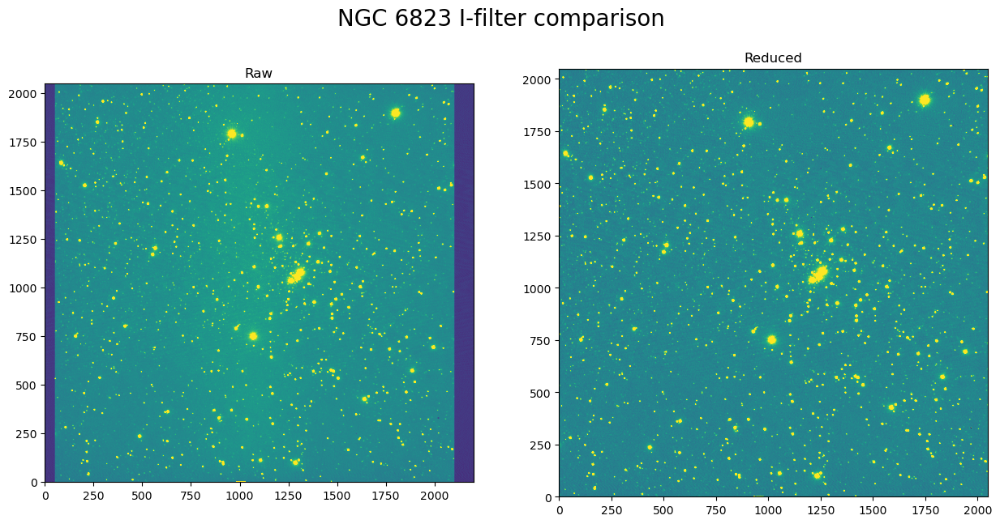

In [22]:
################ Let's look at the science images in different filters! ###########

################################## U filter #########################
NGC_U_raw= glob.glob(data_dir+"a162.fits")
NGC_U_reduced= glob.glob(reduced_dir+"a162otzf.fits")
NGC_U_raw_data= fits.getdata(NGC_U_raw[0])

NGC_U_reduced_data= fits.getdata(NGC_U_reduced[0])



fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_U_raw, vmax_U_raw= interval.get_limits(NGC_U_raw_data)
im1 = axes[0].imshow(NGC_U_raw_data, vmin=vmin_U_raw, vmax=vmax_U_raw, origin='lower', cmap='viridis')
axes[0].set_title("Raw")
#plt.colorbar(im1, ax=axes[1])

vmin_U_reduced, vmax_U_reduced= interval.get_limits(NGC_U_reduced_data)
im0 = axes[1].imshow(NGC_U_reduced_data, vmin=vmin_U_reduced, vmax=vmax_U_reduced, origin='lower', cmap='viridis')
axes[1].set_title("Reduced")
#plt.colorbar(im0, ax=axes[0])


fig.suptitle(f"NGC6823 U-Filter comparison", fontsize=20, y=0.92)
plt.show()


################################## B filter #########################
NGC_B_raw= glob.glob(data_dir+"a160.fits")
NGC_B_reduced= glob.glob(reduced_dir+"a160otzf.fits")
NGC_B_raw_data= fits.getdata(NGC_B_raw[0])

NGC_B_reduced_data= fits.getdata(NGC_B_reduced[0])



fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_B_raw, vmax_B_raw= interval.get_limits(NGC_B_raw_data)
im1 = axes[0].imshow(NGC_B_raw_data, vmin=vmin_B_raw, vmax=vmax_B_raw, origin='lower', cmap='viridis')
axes[0].set_title("Raw")
#plt.colorbar(im1, ax=axes[1])

vmin_B_reduced, vmax_B_reduced= interval.get_limits(NGC_B_reduced_data)
im0 = axes[1].imshow(NGC_B_reduced_data, vmin=vmin_B_reduced, vmax=vmax_B_reduced, origin='lower', cmap='viridis')
axes[1].set_title("Reduced")
#plt.colorbar(im0, ax=axes[0])


fig.suptitle(f"NGC6823 B-Filter comparison", fontsize=20, y=0.92)
plt.show()

################################## V filter #########################
NGC_V_raw= glob.glob(data_dir+"a157.fits")
NGC_V_reduced= glob.glob(reduced_dir+"a157otzf.fits")
NGC_V_raw_data= fits.getdata(NGC_V_raw[0])

NGC_V_reduced_data= fits.getdata(NGC_V_reduced[0])



fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_V_raw, vmax_V_raw= interval.get_limits(NGC_V_raw_data)
im1 = axes[0].imshow(NGC_V_raw_data, vmin=vmin_V_raw, vmax=vmax_V_raw, origin='lower', cmap='viridis')
axes[0].set_title("Raw")
#plt.colorbar(im1, ax=axes[1])

vmin_V_reduced, vmax_V_reduced= interval.get_limits(NGC_V_reduced_data)
im0 = axes[1].imshow(NGC_V_reduced_data, vmin=vmin_V_reduced, vmax=vmax_V_reduced, origin='lower', cmap='viridis')
axes[1].set_title("Reduced")
#plt.colorbar(im0, ax=axes[0])


fig.suptitle(f"NGC6823 V-filter comparison", fontsize=20, y=0.92)
plt.show()

################################## R filter #########################
NGC_R_raw= glob.glob(data_dir+"a155.fits")
NGC_R_reduced= glob.glob(reduced_dir+"a155otzf.fits")
NGC_R_raw_data= fits.getdata(NGC_R_raw[0])

NGC_R_reduced_data= fits.getdata(NGC_R_reduced[0])



fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_R_raw, vmax_R_raw= interval.get_limits(NGC_R_raw_data)
im1 = axes[0].imshow(NGC_R_raw_data, vmin=vmin_R_raw, vmax=vmax_R_raw, origin='lower', cmap='viridis')
axes[0].set_title("Raw")
#plt.colorbar(im1, ax=axes[1])

vmin_R_reduced, vmax_R_reduced= interval.get_limits(NGC_R_reduced_data)
im0 = axes[1].imshow(NGC_R_reduced_data, vmin=vmin_R_reduced, vmax=vmax_R_reduced, origin='lower', cmap='viridis')
axes[1].set_title("Reduced")
#plt.colorbar(im0, ax=axes[0])


fig.suptitle(f"NGC6823 R-Filter comparison", fontsize=20, y=0.92)
plt.show()

################################## I filter #########################
NGC_I_raw= glob.glob(data_dir+"a153.fits")
NGC_I_reduced= glob.glob(reduced_dir+"a153otzf.fits")
NGC_I_raw_data= fits.getdata(NGC_I_raw[0])

NGC_I_reduced_data= fits.getdata(NGC_I_reduced[0])



fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_I_raw, vmax_I_raw= interval.get_limits(NGC_I_raw_data)
im1 = axes[0].imshow(NGC_I_raw_data, vmin=vmin_I_raw, vmax=vmax_I_raw, origin='lower', cmap='viridis')
axes[0].set_title("Raw")
#plt.colorbar(im1, ax=axes[1])

vmin_I_reduced, vmax_I_reduced= interval.get_limits(NGC_I_reduced_data)
im0 = axes[1].imshow(NGC_I_reduced_data, vmin=vmin_I_reduced, vmax=vmax_I_reduced, origin='lower', cmap='viridis')
axes[1].set_title("Reduced")
#plt.colorbar(im0, ax=axes[0])


fig.suptitle(f"NGC 6823 I-filter comparison", fontsize=20, y=0.92)
plt.show()



### Problem 5

Compute the gain and read noise for this CCD using a couple of the flat field images
and bias images, as described in Howell’s Handbook of CCD Astronomy and in class
notes. Decide, by examination, what sections of each image you should use to determine
these values (using the whole frame is probably not a good idea, why?). NOTE: The
flat-field images, F, that are used for this procedure should already be flat-fielded using a
normalized master flat. Otherwise, the sigma term will contain contributions both from
Poisson noise AND from pixel-to-pixel sensitivity fluctuations, and be too large, leading
to an unrealistically small gain.

To calulate the gain, the equation needed is:
$$\text{Gain}= \frac{(\bar F_1 + \bar F_2) - (\bar B_1 + \bar B_2) }{\sigma^2_{F_1 - F_2} - \sigma^2_{B_1 - B_2}}$$

but since I am using bias corrected flats, this simplifies to:
$$\text{Gain}= \frac{(\bar F_1 + \bar F_2) }{\sigma^2_{F_1 - F_2} - \sigma^2_{B_1 - B_2}}$$

I still keep the $\sigma^2_{B_1 - B_2}$ term in the deniminator since that isn't accounted for when I bais corrected


To calculate the read noise, the quation needed is:
$$\text{Read Noise} = \frac{G \cdot \sigma^2_{B_1 - B_2}}{\sqrt{2}}$$

In [ ]:
def find_smooth_region(image, box_size=100, step=10): 
    """
    Return the top-left corner and stats for the box with the lowest variation in image to mitigate artifacts, hot pixels, etc.
    """
    ny, nx = image.shape
    best_std = np.inf
    best_pos = None

    for y in range(0, ny - box_size + 1, step):
        for x in range(0, nx - box_size + 1, step):
            box = image[y:y+box_size, x:x+box_size]

            # skip boxes with NaNs or infs
            if not np.isfinite(box).all():
                continue

            std = np.std(box)

            if std < best_std:
                best_std = std
                best_pos = (y, x)

    return best_pos, best_std

Best region top-left: (140, 20)
Std dev: 130.6870728686746


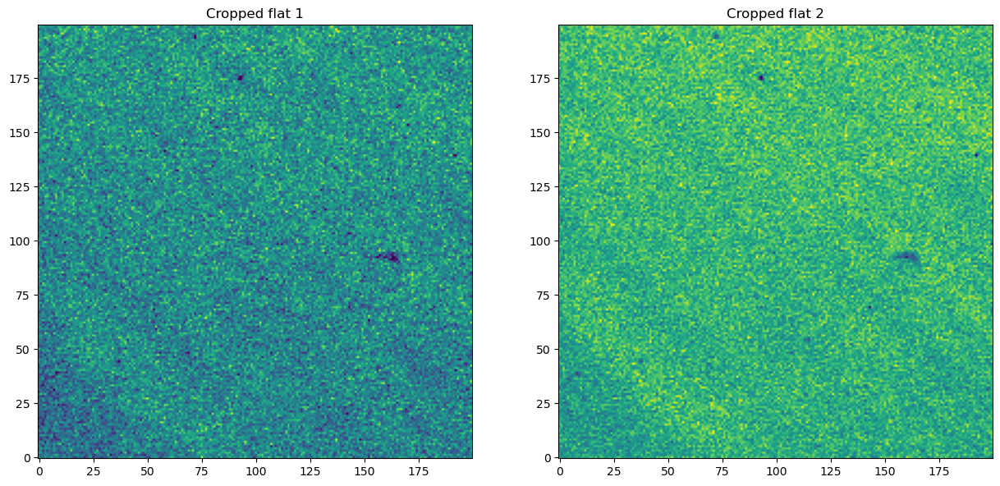

Gain = 1.530 e-/ADU
Read noise = 12.360 e-


In [175]:
f1 = fits.getdata(reduced_dir + "a043otz.fits")  # flat 1 3-second exposure
f2 = fits.getdata(reduced_dir + "a044otz.fits")  # flat 2 6-second exposure
b1 = fits.getdata(reduced_dir + "a093ot.fits")    # bias 1
b2 = fits.getdata(reduced_dir + "a094ot.fits")    # bias 2

# Finding a clean central region, avoiding edges, bad columns, dust, etc.

pos, std = find_smooth_region((f1-f2), box_size=400, step=20)
print("Best region top-left:", pos)
print("Std dev:", std)

y, x = pos
roi = np.s_[y:y+200, x:x+200]

#roi = np.s_[1100:1350, 750:1000] #use this line to manually define a region

F1 = f1[roi]
F2 = f2[roi]
B1 = b1[roi]
B2 = b2[roi]

fig, axes = plt.subplots(1, 2, figsize=(15, 8))
interval=ZScaleInterval()

vmin_F1, vmax_F1= interval.get_limits(F1)
im1 = axes[0].imshow(F1, vmin=vmin_F1, vmax=vmax_F1, origin='lower', cmap='viridis')
axes[0].set_title("Cropped flat 1")
#plt.colorbar(im1, ax=axes[1])

vmin_F2, vmax_F2= interval.get_limits(F2)
im0 = axes[1].imshow(F2, vmin=vmin_F2, vmax=vmax_F2, origin='lower', cmap='viridis')
axes[1].set_title("Cropped flat 2")
#plt.colorbar(im0, ax=axes[0])

plt.show()

# Difference images
dF = F2 - F1
dB = B2 - B1

# Means of the flats
mean_F = (np.mean(F1) + np.mean(F2))

# Variances of the difference images
var_dF = np.var(dF, ddof=1)
var_dB = np.var(dB, ddof=1)

# Gain in e-/ADU
gain = (mean_F) / (var_dF - var_dB)


# Read noise in electrons
read_noise_e = gain *np.sqrt(var_dB / 2.0)

print(f"Gain = {gain:.3f} e-/ADU")
print(f"Read noise = {read_noise_e:.3f} e-")